In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


### Loading the image

In [ ]:
import cv2

In [ ]:
image = cv2.imread("/content/gdrive/MyDrive/Computer Vision Masterclass/Images/people1.jpg")

In [ ]:
image.shape

(1280, 1920, 3)

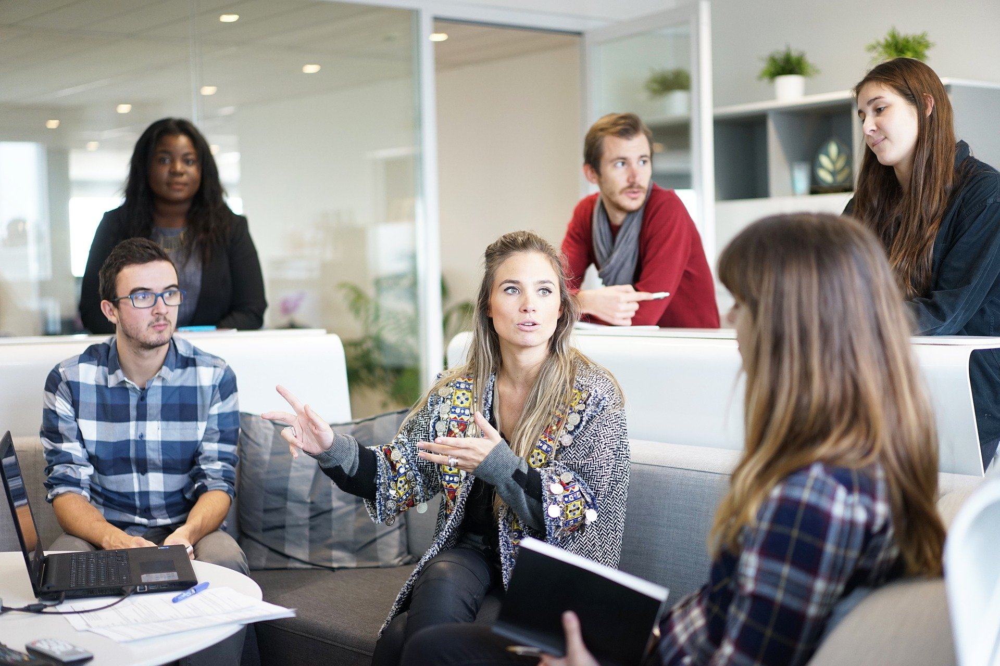

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [ ]:
image=cv2.resize(image,(800,600))
image.shape

(600, 800, 3)

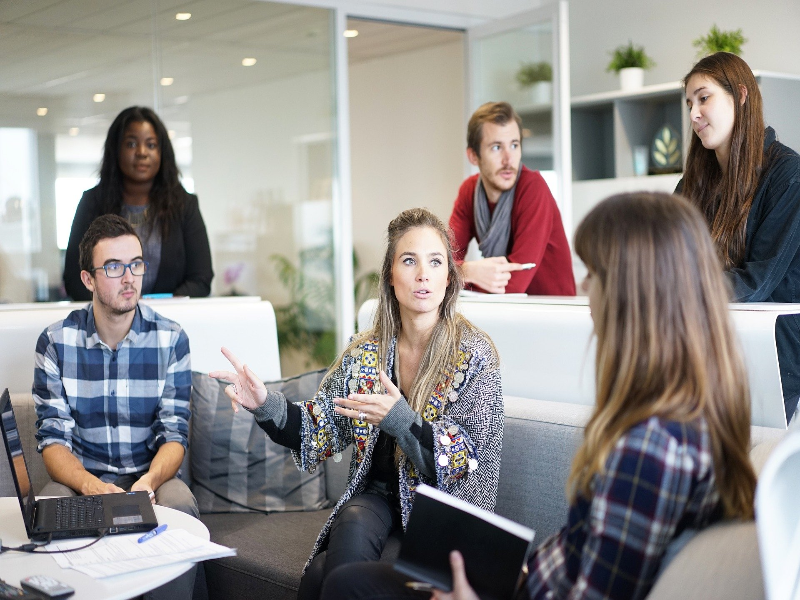

In [ ]:
cv2_imshow(image)

Cascade detector recommends to use greyscale image, hence converting the image into greyscale

In [ ]:
600*800*3,600*800,1440000-480000

(1440000, 480000, 960000)

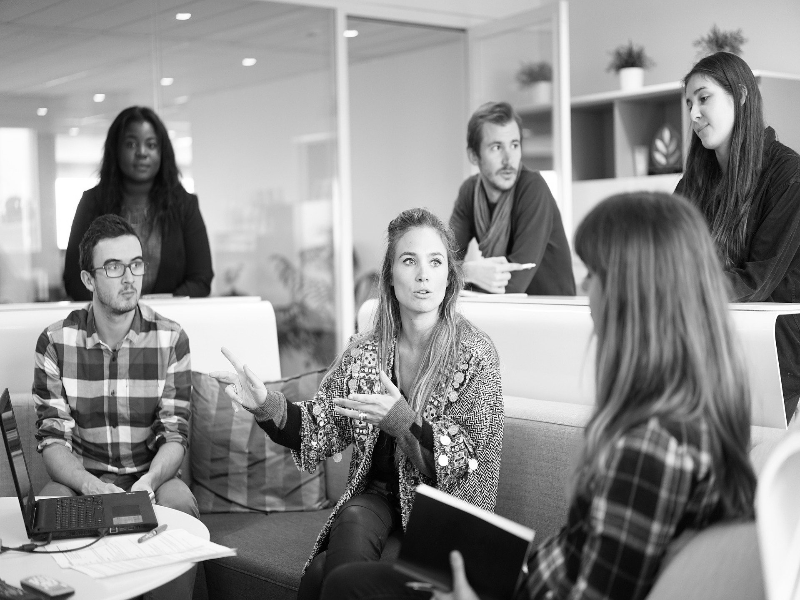

In [ ]:
image_grey=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
cv2_imshow(image_grey)

In [ ]:
image_grey.shape

(600, 800)

## Detect Faces

In [ ]:
face_detector = cv2.CascadeClassifier('/content/gdrive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')

In [ ]:
detections = face_detector.detectMultiScale(image_grey)

In [ ]:
detections
#each row indicate a face, hence 6 faces were detected.4 values are 4 corrdinates of the bounding boxes around the faces (x,y,size of the face detected(length and breadth in pixel))

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [ ]:
len(detections)

6

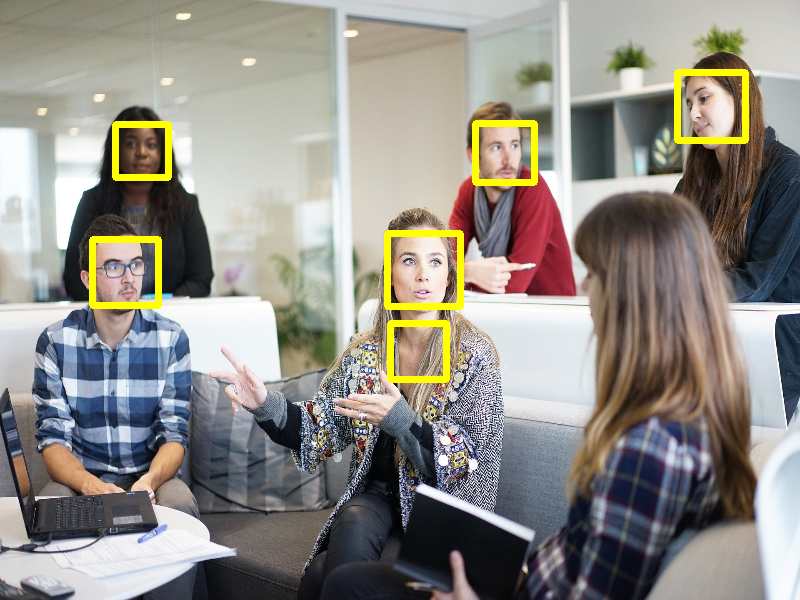

In [ ]:
for (x,y,w,h) in detections:
  # print(x,y,w,h)
  cv2.rectangle(image,(x,y),(x+w,y+h),(0,255,255),5)
cv2_imshow(image)

## Harcascade parameters

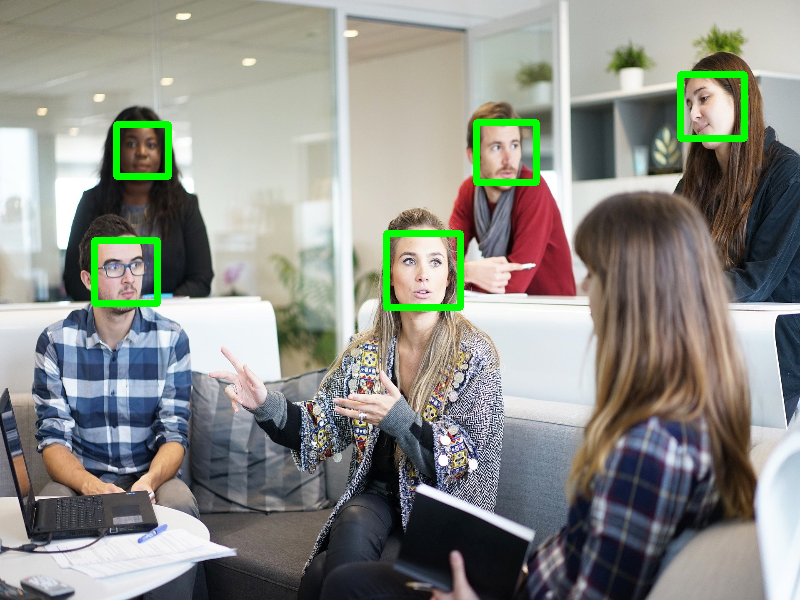

In [ ]:
image = cv2.imread("/content/gdrive/MyDrive/Computer Vision Masterclass/Images/people1.jpg")
image=cv2.resize(image,(800,600))
image_grey=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_grey,scaleFactor=1.3) #larger the object,larger the scale value
for (x,y,w,h) in detections:
  cv2.rectangle(image,(x,y),(x+w,y+h),(0,255,0),5)
cv2_imshow(image)

47 47
47 47
49 49
49 49
52 52
51 51
46 46
44 44
51 51
50 50
51 51
47 47


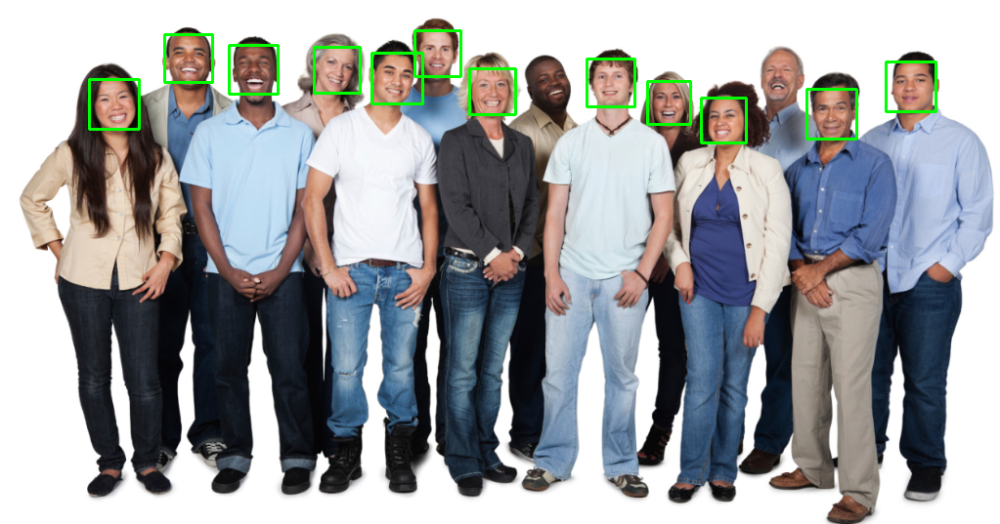

In [ ]:
image = cv2.imread("/content/gdrive/MyDrive/Computer Vision Masterclass/Images/people2.jpg")
image_grey=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_grey,scaleFactor=1.2,minNeighbors=7,minSize=(10,10),maxSize=(100,100)) #default value of minSize is 30*30
for (x,y,w,h) in detections:
  print(w,h)
  cv2.rectangle(image,(x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(image)

## Eye Detection

In [ ]:
eye_detector= cv2.CascadeClassifier("/content/gdrive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_eye.xml")

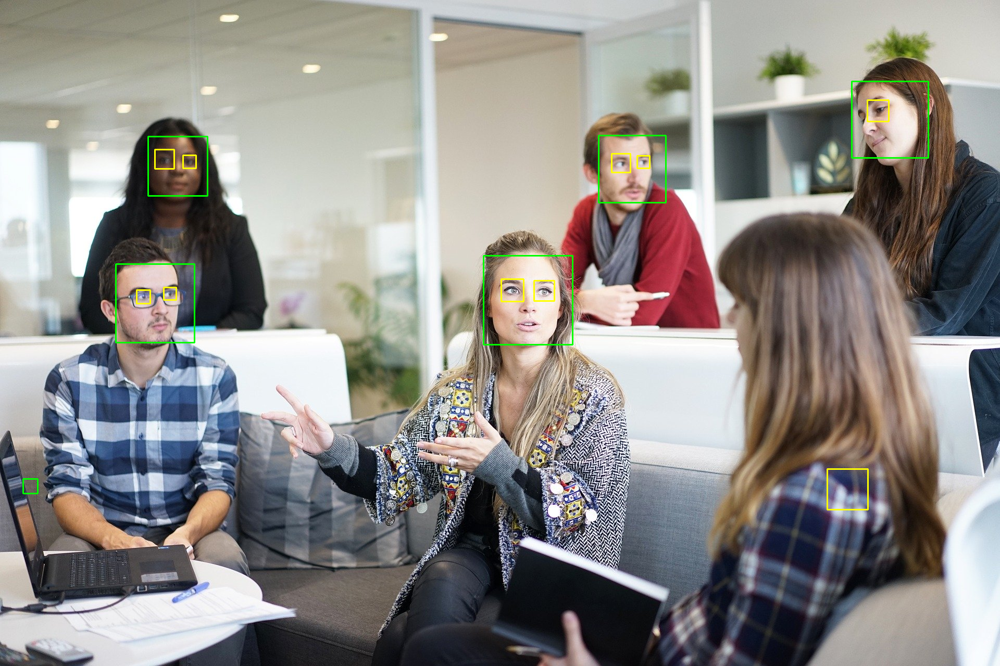

In [ ]:
#image=cv2.resize(image,(800,600))
image_grey=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_grey,scaleFactor=1.3)
for (x,y,w,h) in detections:
  cv2.rectangle(image,(x,y),(x+w,y+h),(0,255,0),2)
eye_detections = eye_detector.detectMultiScale(image_grey,scaleFactor=1.1,minNeighbors=10)
for (x,y,w,h) in eye_detections:
  cv2.rectangle(image,(x,y),(x+w,y+h),(0,255,255),2)
cv2_imshow(image)

HOMEWORK

In [ ]:
car_image = cv2.imread("/content/gdrive/MyDrive/Computer Vision Masterclass/Images/car.jpg")

In [ ]:
car_image.shape

(286, 468, 3)

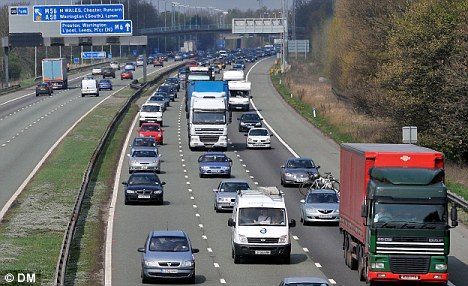

In [ ]:
cv2_imshow(car_image)

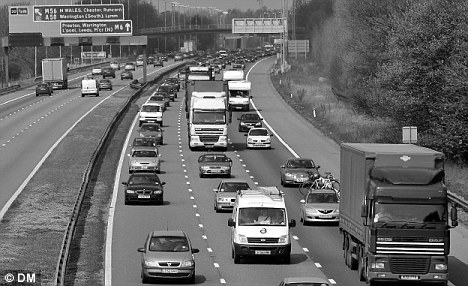

In [ ]:
car_image_grey = cv2.cvtColor(car_image,cv2.COLOR_BGR2GRAY)
cv2_imshow(car_image_grey)

In [ ]:
car_detector = cv2.CascadeClassifier("/content/gdrive/MyDrive/Computer Vision Masterclass/Cascades/cars.xml")
cars = car_detector.detectMultiScale(car_image_grey,scaleFactor=1.03,minNeighbors=5)
cars

array([[ 74,  75,  32,  32],
       [221,  87,  35,  35],
       [365, 110,  46,  46],
       [190, 147,  46,  46],
       [103, 149,  81,  81],
       [208, 191,  32,  32],
       [295, 191,  53,  53],
       [220, 200,  84,  84]], dtype=int32)

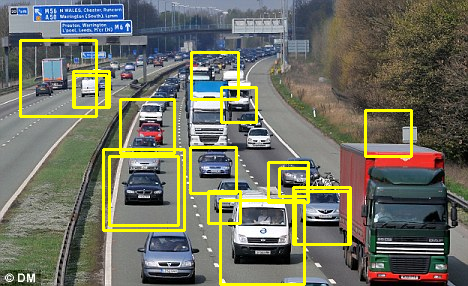

In [ ]:
for (x,y,w,h) in cars:
  cv2.rectangle(car_image,(x,y),(x+w,y+h),(0,255,255),2)
cv2_imshow(car_image)

## HOG dectetor using Dlib

In [ ]:
import dlib
import cv2

In [ ]:
image = cv2.imread("/content/gdrive/MyDrive/Computer Vision Masterclass/Images/people2.jpg")

In [ ]:
from google.colab.patches import cv2_imshow


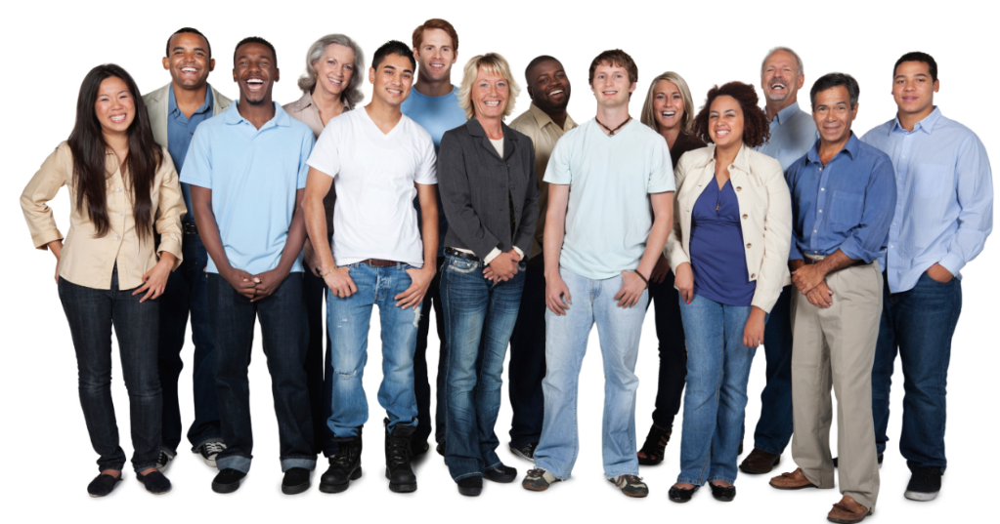

In [ ]:
cv2_imshow(image)

In [ ]:
face_detector_hog = dlib.get_frontal_face_detector()

In [ ]:
detections = face_detector_hog(image,1)

In [ ]:
detections

rectangles[[(429, 38) (465, 74)], [(665, 90) (701, 126)], [(717, 103) (760, 146)], [(909, 70) (952, 113)], [(828, 98) (871, 142)], [(605, 70) (641, 106)], [(777, 62) (813, 98)], [(485, 78) (521, 114)], [(386, 60) (429, 103)], [(170, 41) (213, 84)], [(93, 89) (136, 132)], [(237, 50) (280, 94)], [(323, 50) (367, 94)], [(544, 65) (588, 108)]]

In [ ]:
len(detections)

14

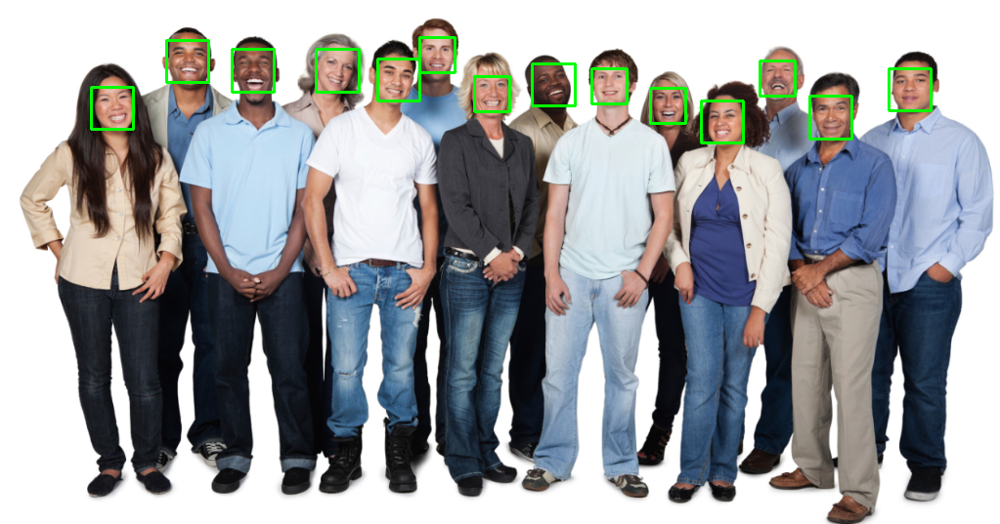

In [ ]:
for face in detections:
  # print(face) # [(left,top)(right,bottom)]
  # print(face.left())
  l,t,r,b= face.left(),face.top(),face.right(),face.bottom()
  cv2.rectangle(image,(l,t),(r,b),(0,255,0),2)
cv2_imshow(image)

## Detect faces using CNN

In [ ]:
image = cv2.imread("/content/gdrive/MyDrive/Computer Vision Masterclass/Images/people2.jpg")
cnn_detector = dlib.cnn_face_detection_model_v1('/content/gdrive/MyDrive/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')

In [ ]:
detections = cnn_detector(image,1)

In [ ]:
detections

mmod_rectangles[[(476, 71) (524, 118)], [(325, 49) (364, 89)], [(541, 65) (580, 105)], [(827, 90) (874, 137)], [(721, 105) (760, 145)], [(173, 41) (212, 81)], [(236, 47) (284, 94)], [(385, 57) (424, 97)], [(92, 80) (140, 128)], [(605, 65) (644, 105)], [(665, 85) (704, 125)], [(909, 65) (948, 105)], [(425, 37) (464, 77)], [(777, 57) (816, 97)]]

1.1440608501434326
1.137050747871399
1.1278988122940063
1.1200271844863892
1.114937663078308
1.1131559610366821
1.0975686311721802
1.0942121744155884
1.0853146314620972
1.08018958568573
1.0800749063491821
1.0784765481948853
1.0664018392562866
1.064179539680481


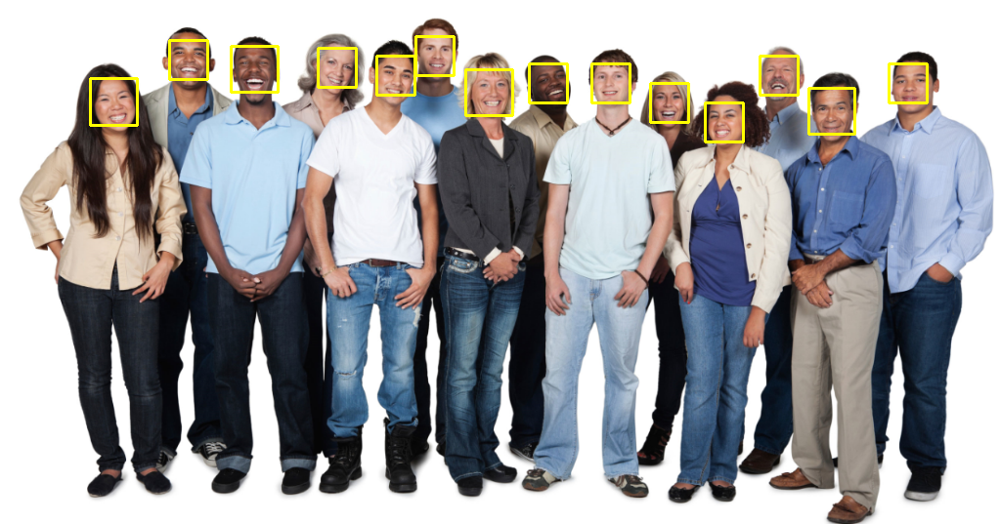

In [ ]:
for face in detections:
  l,t,r,b,c =face.rect.left(),face.rect.top(),face.rect.right(),face.rect.bottom(),face.confidence
  print(c)
  cv2.rectangle(image,(l,t),(r,b),(0,255,255),2)
cv2_imshow(image)

## Comparison

In [ ]:
image = cv2.imread("/content/gdrive/MyDrive/Computer Vision Masterclass/Images/people3.jpg")

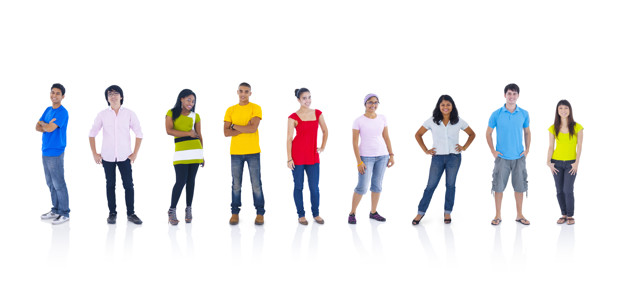

In [ ]:
cv2_imshow(image)

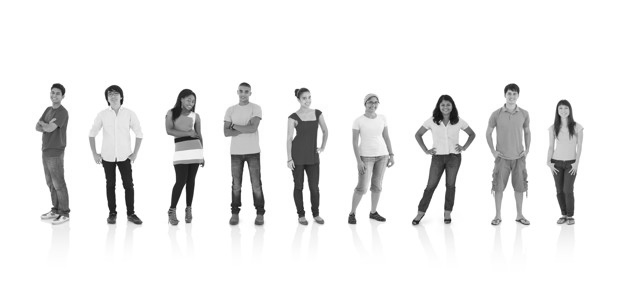

In [ ]:
grey_image=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
cv2_imshow(grey_image)

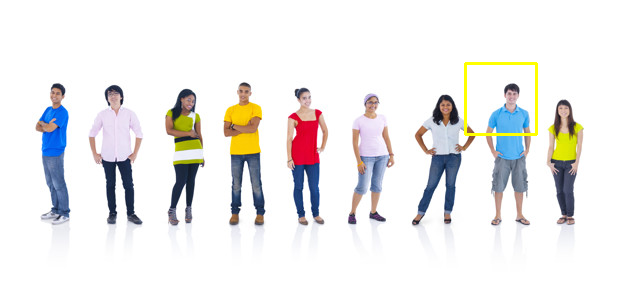

In [ ]:
HC_face_detector = cv2.CascadeClassifier("/content/gdrive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml")
HC_detection= HC_face_detector.detectMultiScale(grey_image,scaleFactor= 1.001,minNeighbors=5)

for (x,y,w,h) in HC_detection:
  cv2.rectangle(image,(x,y),(x+w,y+h),(0,255,255),2)
cv2_imshow(image)


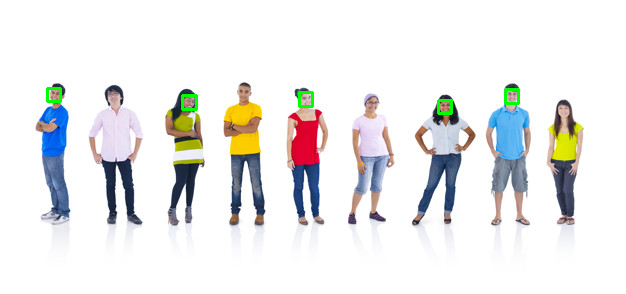

In [ ]:
HOG_face_detector = dlib.get_frontal_face_detector()
HOG_detection = HOG_face_detector(image,4)
for face in HOG_detection:
  l,t,r,b= face.left(),face.top(),face.right(),face.bottom()
  cv2.rectangle(image,(l,t),(r,b),(0,255,0),2)
cv2_imshow(image)

0.44638633728027344
0.08115899562835693


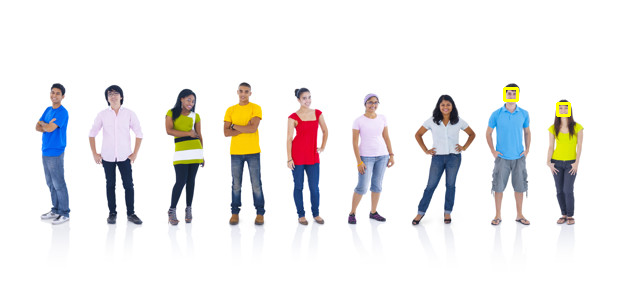

In [ ]:
CNN_face_detector = dlib.cnn_face_detection_model_v1("/content/gdrive/MyDrive/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat")
CNN_detection= CNN_face_detector(image,4)
for face in CNN_detection:
  l,t,r,b,c =face.rect.left(),face.rect.top(),face.rect.right(),face.rect.bottom(),face.confidence
  print(c)
  cv2.rectangle(image,(l,t),(r,b),(0,255,255),2)
cv2_imshow(image)

#### HOG performed the best with the above picture